In [1]:
# clone YOLOv5
!git clone https://github.com/ultralytics/yolov5
!cd yolov5

# install dependensi
!pip install -r /content/yolov5/requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17544, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 17544 (delta 25), reused 3 (delta 3), pack-reused 17502 (from 2)
Receiving objects: 100% (17544/17544), 16.66 MiB | 16.99 MiB/s, done.
Resolving deltas: 100% (12022/12022), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 31.6 MB/s eta 0:00:00


In [2]:
!pip uninstall -y scikit-fuzzy
!pip install git+https://github.com/scikit-fuzzy/scikit-fuzzy.git
!pip install yt-dlp


  Cloning https://github.com/scikit-fuzzy/scikit-fuzzy.git to /tmp/pip-req-build-l1cr_ow9
  Running command git clone --filter=blob:none --quiet https://github.com/scikit-fuzzy/scikit-fuzzy.git /tmp/pip-req-build-l1cr_ow9
  Resolved https://github.com/scikit-fuzzy/scikit-fuzzy.git to commit be7e344f3ce65845e39922aa5fc1af7412d01944
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.5.0-py2.py3-none-any.whl size=920854 sha256=739197d0a36d0340da7e29e8ec4d2c8eb6c93e8490ee5d1312ca6ed753278764
  Stored in directory: /tmp/pip-ephem-wheel-cache-q553s8un/wheels/05/c5/85/dc201155e89cdaf150db04478afc9f7fc3bc1f3fe1f2268a74
Successfully built scikit-fuzzy
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.9/175.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 55.9 MB/s 

##IMPORT LIBRARY

In [29]:
import os, json, time, math
from typing import Dict, List, Any

import numpy as np
import pandas as pd
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

import skfuzzy as fuzz
from skfuzzy import control as ctrl
from yt_dlp import YoutubeDL


os.environ["OPENCV_FFMPEG_CAPTURE_OPTIONS"] = (
    "reconnect;1|reconnect_streamed;1|reconnect_on_network_error;1|"
    "rw_timeout;15000000|http_persistent;0|multiple_requests;1"
)
try:
    cv2.utils.logging.setLogLevel(cv2.utils.logging.LOG_LEVEL_ERROR)
except Exception:
    pass


##MAKE COOKIES FOR YT-DLP PERMISSION


In [7]:
from yt_dlp import YoutubeDL

url = "https://www.youtube.com/live/ByED80IKdIU"
cookies_path = "/content/cookies.txt"

ydl_opts = {
    "cookiefile": cookies_path,
    "quiet": True,
    "no_warnings": True,
    "format": "best[height<=480]",
}

with YoutubeDL(ydl_opts) as ydl:
    info = ydl.extract_info(url, download=False)
    print("Stream URL:", info["url"])


Stream URL: https://manifest.googlevideo.com/api/manifest/hls_playlist/expire/1755766789/ei/pYumaKypCKimzN0Py9vBgQ0/ip/34.125.120.149/id/ByED80IKdIU.3/itag/94/source/yt_live_broadcast/requiressl/yes/ratebypass/yes/live/1/sgoap/gir%3Dyes%3Bitag%3D140/sgovp/gir%3Dyes%3Bitag%3D135/rqh/1/hls_chunk_host/rr10---sn-2oa5n5-5x.googlevideo.com/xpc/EgVo2aDSNQ%3D%3D/playlist_duration/30/manifest_duration/30/siu/1/bui/AY1jyLP2VaoG79wkXNB8NUAmaWtToFigqC3_g5q5Bu6qMXLL4MTUPPrwyH23zj_TnbgsmdKlnw/spc/l3OVKa2BHAuJSQSndYlnfKoTLsZUKnNfNjadTL-Vl_i4g8krOauWQaW2DV7kNFBwg5QHs_PKZZr4hRiFQGA/vprv/1/playlist_type/DVR/met/1755745190,/mh/jK/mm/44/mn/sn-2oa5n5-5x/ms/lva/mv/u/mvi/10/pl/20/rms/lva,lva/dover/11/pacing/0/keepalive/yes/fexp/51355912,51548755,51565115,51565681,51580968/mt/1755744406/sparams/expire,ei,ip,id,itag,source,requiressl,ratebypass,live,sgoap,sgovp,rqh,xpc,playlist_duration,manifest_duration,siu,bui,spc,vprv,playlist_type/sig/AJfQdSswRAIgJukq0zmFRbZvtAnqEgXQZ_9xfFNjUWwH4qspIeRNlIgCIBjy1IDwsyvTj1nH

##CONFIGS

In [8]:
CONF_THRESH = 0.15
IMGSZ = 1280
INFER_EVERY_N_FRAMES = 2
AGGREGATE_EVERY_SEC = 5

# Fuzzy timming
BASE_GREEN = 20
EXTRA_MAX = 30
AUTO_MAX_PCU = True

USE_PRESET_POLY = True
ROI_JSON_PATH = "rois_4corners_poly.json"

PRESET_ROIS_NORM = [
    { "dir":"West",  "poly":[[0,0.85],[0.25,0.82],[0.2,0.67],[0,0.7]] },
    { "dir":"North", "poly":[[0.24,0.57],[0.45,0.53],[0.12,0.11],[0.1,0.11]] },
    { "dir":"East",  "poly":[[0.75,0.6],[1,0.55],[1,0.47],[0.65,0.52]] },
    { "dir":"South", "poly":[[0.57,0.79],[0.85,0.75],[1,0.9],[1,1],[0.71,1]] },
]

DIRECTIONS = ["West","North","East","South"]
VEHICLE_CLASSES = {"car","truck","bus","motorcycle","bicycle"}
PCU = {'motorcycle':0.5,'car':1.0,'kendaraan_besar':2.0,'bicycle':0.5}


##UTILS

In [9]:
from yt_dlp import YoutubeDL

def get_youtube_stream_url(u):
    with YoutubeDL({
        "quiet": True,
        "no_warnings": True,
        "format": "best[height<=480]",
        "cookiefile": "/content/cookies.txt"
    }) as ydl:
        return ydl.extract_info(u, download=False)["url"]

def kategori_kendaraan(label):
    return "kendaraan_besar" if label in ("bus","truck") else label

def center_of_box(xyxy):
    x1,y1,x2,y2 = xyxy
    return (float(x1+x2)/2.0, float(y1+y2)/2.0)

def point_in_poly(x, y, poly):
    inside = False
    n = len(poly)
    for i in range(n):
        x1, y1 = poly[i]
        x2, y2 = poly[(i+1) % n]
        cond = ((y1 > y) != (y2 > y)) and (x < (x2-x1)*(y-y1)/(y2-y1 + 1e-9) + x1)
        if cond: inside = not inside
    return inside

def build_fuzzy(max_pcu=60, extra_max=30):
    density = ctrl.Antecedent(np.linspace(0, max_pcu, 101), 'density')
    add     = ctrl.Consequent(np.linspace(0, extra_max, 101), 'add')
    mid = max_pcu/2
    density['low']  = fuzz.trimf(density.universe, [0, 0, 0.6*mid])
    density['med']  = fuzz.trimf(density.universe, [0.3*mid, mid, 0.8*max_pcu])
    density['high'] = fuzz.trimf(density.universe, [mid, max_pcu, max_pcu])
    add['small']  = fuzz.trimf(add.universe, [0,0,0.4*extra_max])
    add['medium'] = fuzz.trimf(add.universe, [0.2*extra_max,0.5*extra_max,0.8*extra_max])
    add['large']  = fuzz.trimf(add.universe, [0.6*extra_max,extra_max,extra_max])
    rules = [ctrl.Rule(density['low'],add['small']),
             ctrl.Rule(density['med'],add['medium']),
             ctrl.Rule(density['high'],add['large'])]
    return ctrl.ControlSystemSimulation(ctrl.ControlSystem(rules))

def infer_extra_seconds(sim, v):
    sim.input['density'] = float(v)
    sim.compute()
    return float(sim.output['add'])


In [10]:
def load_and_scale_rois(cap, path=ROI_JSON_PATH):
    ok, frame_probe = cap.read()
    if not ok:
        raise RuntimeError("Gagal baca frame untuk ukuran stream.")
    H, W = frame_probe.shape[:2]
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

    if USE_PRESET_POLY and PRESET_ROIS_NORM:
        rois_scaled = []
        for r in PRESET_ROIS_NORM:
            poly = [[int(round(p[0]*W)), int(round(p[1]*H))] for p in r["poly"]]
            rois_scaled.append({"dir": r["dir"], "poly": poly})
        return rois_scaled, (W, H)

    with open(path, 'r') as f:
        data = json.load(f)
    rois_raw = data["rois"] if (isinstance(data, dict) and "rois" in data) else data

    rois_scaled = []
    for r in rois_raw:
        poly = r["poly"]
        is_norm = all(0.0 <= p[0] <= 1.0 and 0.0 <= p[1] <= 1.0 for p in poly)
        if is_norm:
            poly_scaled = [[int(round(p[0]*W)), int(round(p[1]*H))] for p in poly]
        else:
            poly_scaled = poly
        rois_scaled.append({"dir": r["dir"], "poly": poly_scaled})
    return rois_scaled, (W, H)

def draw_overlay(frame, rois_poly, dets):
    img = frame.copy()

    for r in rois_poly:
        pts = np.array(r["poly"], dtype=np.int32).reshape((-1,1,2))
        cv2.polylines(img, [pts], isClosed=True, color=(0,255,255), thickness=2)
        x0,y0 = r["poly"][0]
        cv2.putText(img, r["dir"], (x0+6, y0+24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,255), 3)

    for d in dets:
        x1,y1,x2,y2 = d["box_xyxy"]
        cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.putText(img, d["label"], (x1, max(0,y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)
    return img


##MAIN FUNCTION


In [27]:
def main():
    print("Start taking stream URL")
    cap = cv2.VideoCapture(get_youtube_stream_url(url), cv2.CAP_FFMPEG)
    if not cap.isOpened():
        raise RuntimeError("Failed open stream")

    # probe & ROI
    ok, probe = cap.read()
    retry_read = 0
    while not ok and retry_read < 5:
        print("Failed to read frame, retry...")
        time.sleep(1)
        cap.release()
        cap = cv2.VideoCapture(get_youtube_stream_url(url), cv2.CAP_FFMPEG)
        ok, probe = cap.read()
        retry_read += 1
    if not ok:
        raise RuntimeError("Error")

    H, W = probe.shape[:2]
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

    rois_poly, _ = load_and_scale_rois(cap, ROI_JSON_PATH)

    model = YOLO("yolov8n.pt")

    unique_ids_this_window = set()
    agg_counts = {r["dir"]: {"kendaraan_besar":0, "car":0, "motorcycle":0, "bicycle":0} for r in rois_poly}
    agg_pcu = {r["dir"]:0.0 for r in rois_poly}

    frame_id = 0
    t0 = time.time()
    fuzzy_sim = build_fuzzy()

    last_dets = []
    fail_reads = 0

    while True:
        ok, frame = cap.read()
        if not ok:
            fail_reads += 1
            print(f"read failed ({fail_reads})")
            if fail_reads >= 5:
                cap.release()
                time.sleep(1)
                cap = cv2.VideoCapture(get_youtube_stream_url(url), cv2.CAP_FFMPEG)
                fail_reads = 0
            time.sleep(0.2)
            continue
        fail_reads = 0

        dets_json = []
        if frame_id % INFER_EVERY_N_FRAMES == 0:
            results = model.track(
                source=frame,
                imgsz=IMGSZ,
                conf=CONF_THRESH,
                iou=0.5,
                persist=True,
                verbose=False,
                tracker="bytetrack.yaml",
                classes=[1, 2, 3, 5, 7],
            )

            r = results[0] if results else None
            if r is not None and r.boxes is not None and len(r.boxes) > 0:
                names = model.names
                for b in r.boxes:
                    if b.id is None:
                        continue
                    tid = int(b.id.item())
                    cls_name = names[int(b.cls.item())]
                    if cls_name not in VEHICLE_CLASSES:
                        continue

                    xyxy = b.xyxy.cpu().numpy().ravel()
                    cx, cy = center_of_box(xyxy)

                    hit_dir = None
                    for rroi in rois_poly:
                        if point_in_poly(cx, cy, rroi["poly"]):
                            hit_dir = rroi["dir"]
                            break
                    if hit_dir is None:
                        continue

                    kat = kategori_kendaraan(cls_name)
                    uid = f"{hit_dir}:{tid}"
                    if uid not in unique_ids_this_window:
                        unique_ids_this_window.add(uid)
                        agg_counts[hit_dir][kat] += 1
                        agg_pcu[hit_dir] += PCU.get(kat, 0.0)

                    x1,y1,x2,y2 = map(int, xyxy)
                    dets_json.append({
                        "label": kat,
                        "dir": hit_dir,
                        "box_xyxy": [x1,y1,x2,y2]
                    })

            last_dets = dets_json if dets_json else last_dets
        else:
            dets_json = last_dets

        draw = draw_overlay(frame, rois_poly, dets_json)

        if time.time() - t0 >= AGGREGATE_EVERY_SEC:
            pcu_vals = list(agg_pcu.values())
            pcu_max_seen = max(10.0, max(pcu_vals) if pcu_vals else 10.0)
            max_pcu_for_fuzzy = pcu_max_seen*1.2 if AUTO_MAX_PCU else 60
            fuzzy_sim = build_fuzzy(max_pcu_for_fuzzy, EXTRA_MAX)

            extra_dir, total_green = {}, {}
            for d in agg_pcu:
                extra = infer_extra_seconds(fuzzy_sim, agg_pcu[d])
                extra_dir[d] = float(extra)
                total_green[d] = float(BASE_GREEN + extra)

            if all(v == 0 for v in agg_pcu.values()):
                best_dir = None
            else:
                best_dir = max(agg_pcu, key=lambda k: agg_pcu[k]) if agg_pcu else None

            # Generate table and image
            rows=[]
            for d in ["West","North","East","South"]:
                if any(r["dir"]==d for r in rois_poly):
                    rows.append({
                        "Arah": d,
                        "PCU": round(agg_pcu[d],1),
                        "car": int(agg_counts[d]["car"]),
                        "motorcycle": int(agg_counts[d]["motorcycle"]),
                        "bicycle": int(agg_counts[d]["bicycle"]),
                        "kendaraan_besar": int(agg_counts[d]["kendaraan_besar"]),
                        "Extra(s)": round(extra_dir.get(d,0.0),1),
                        "Total Hijau(s)": round(total_green.get(d,BASE_GREEN),1),
                        "Prioritas?": "YA" if best_dir and d==best_dir else "TIDAK"
                    })

            print("=================================================================================================================")
            print("Live Image:")
            cv2_imshow(draw)
            display(pd.DataFrame(rows))
            print(f">>> Priority: {best_dir if best_dir else 'None'}\n")


            unique_ids_this_window = set()
            agg_counts = {r["dir"]: {"kendaraan_besar":0, "car":0, "motorcycle":0, "bicycle":0} for r in rois_poly}
            agg_pcu = {r["dir"]:0.0 for r in rois_poly}
            t0 = time.time()

        frame_id += 1


Start taking stream URL
Live Image:


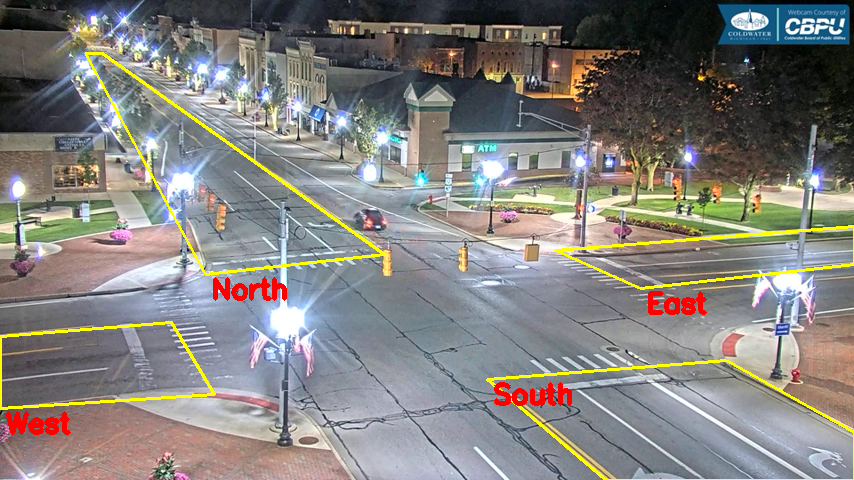

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


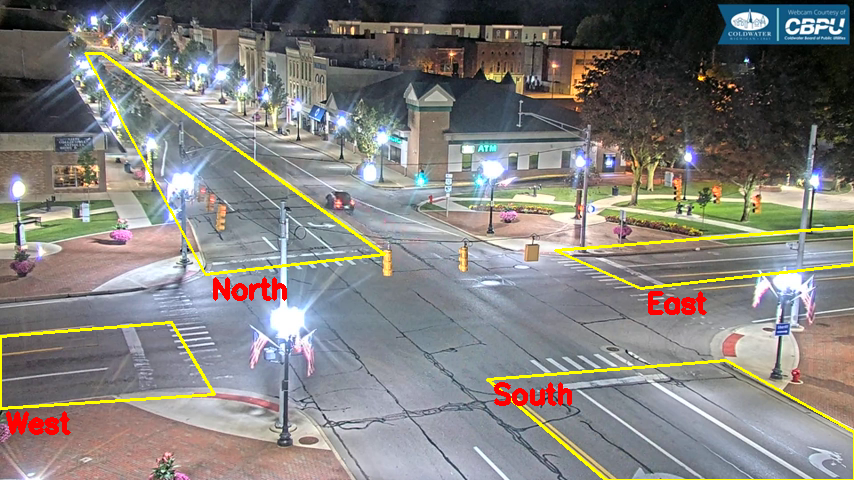

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


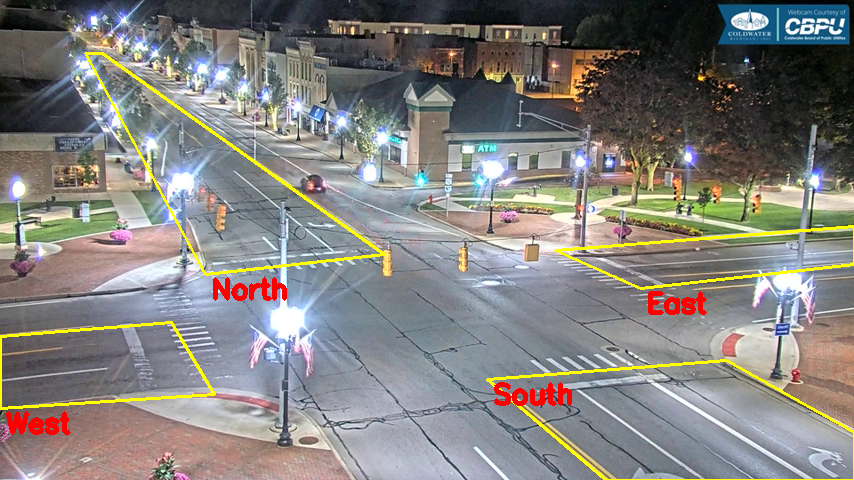

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


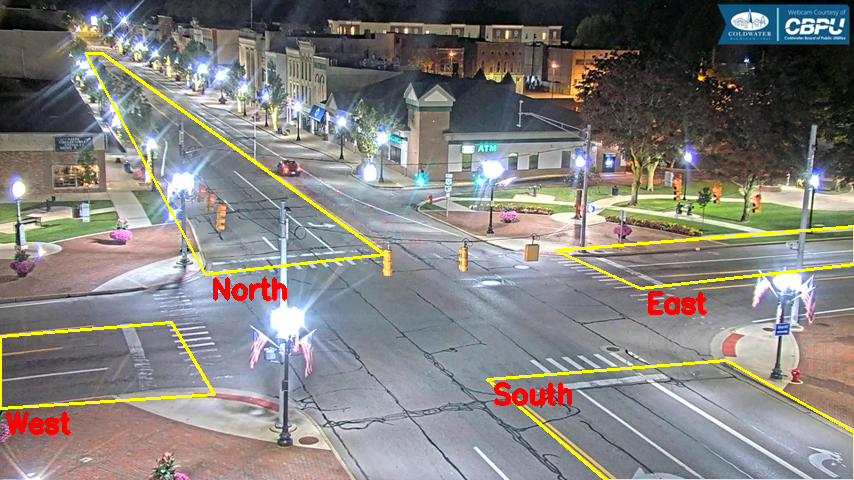

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


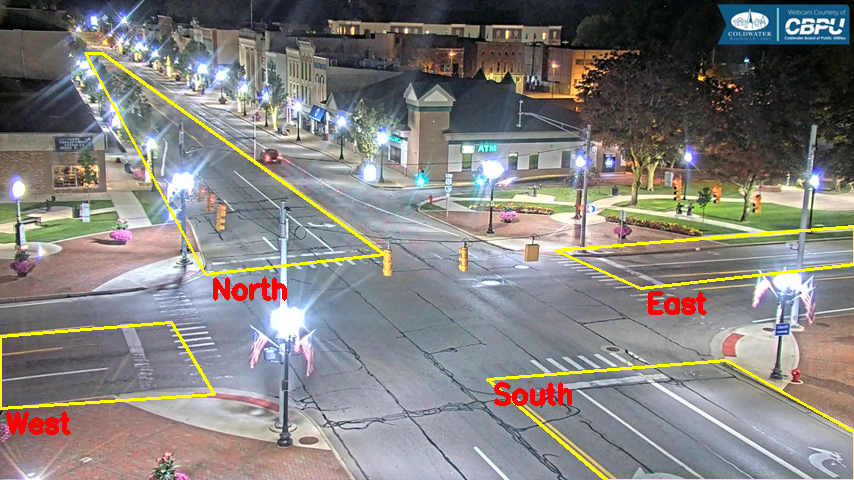

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


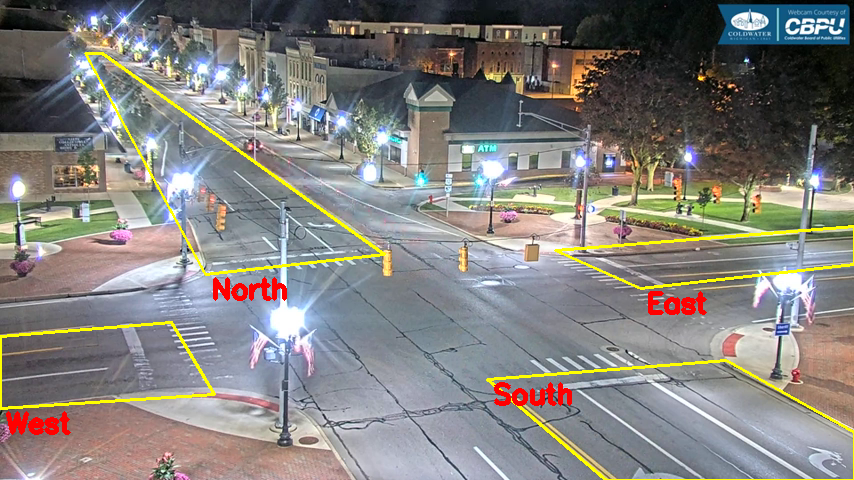

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


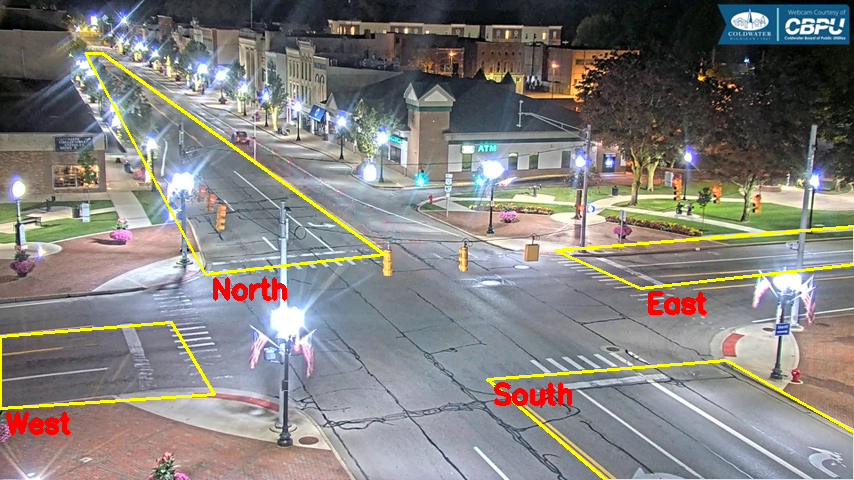

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


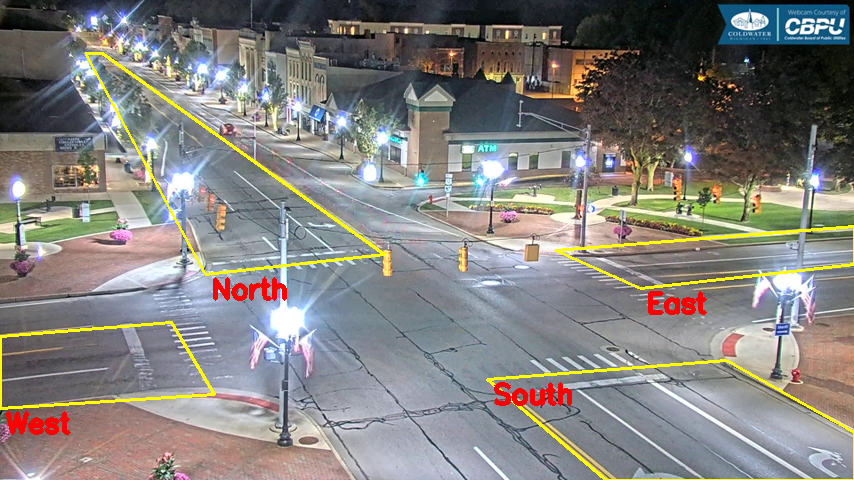

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,0.0,0,0,0,0,4.0,24.0,TIDAK
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: None

Live Image:


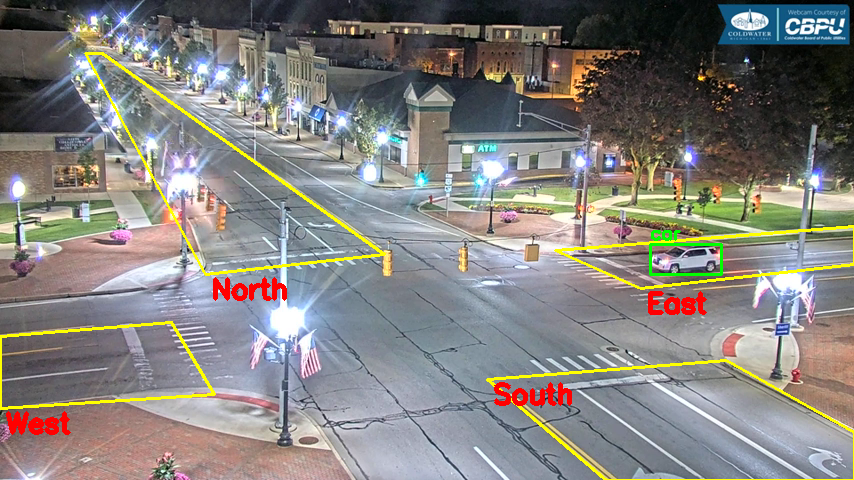

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


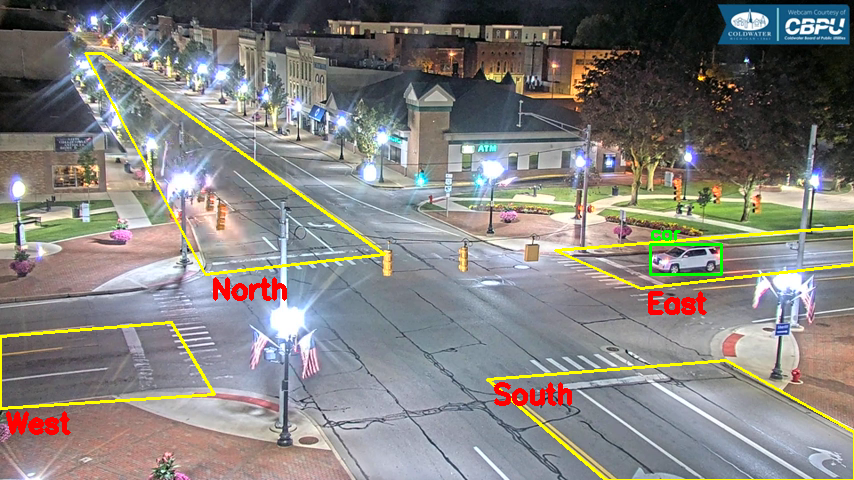

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


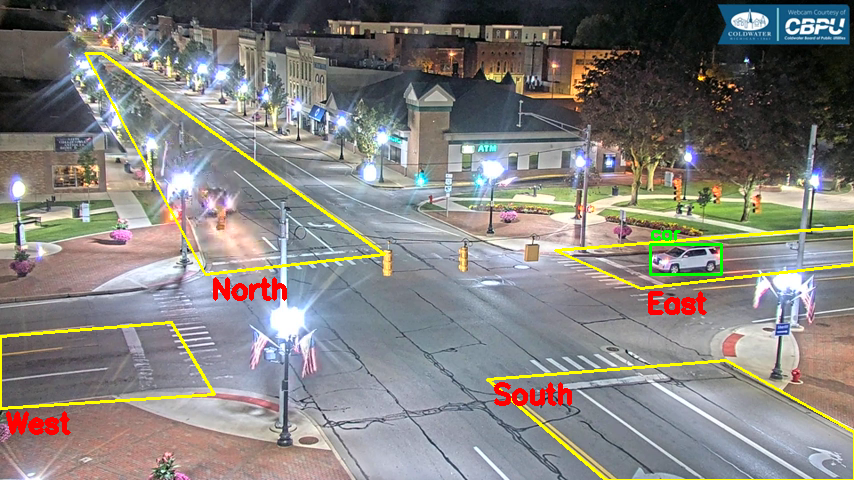

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


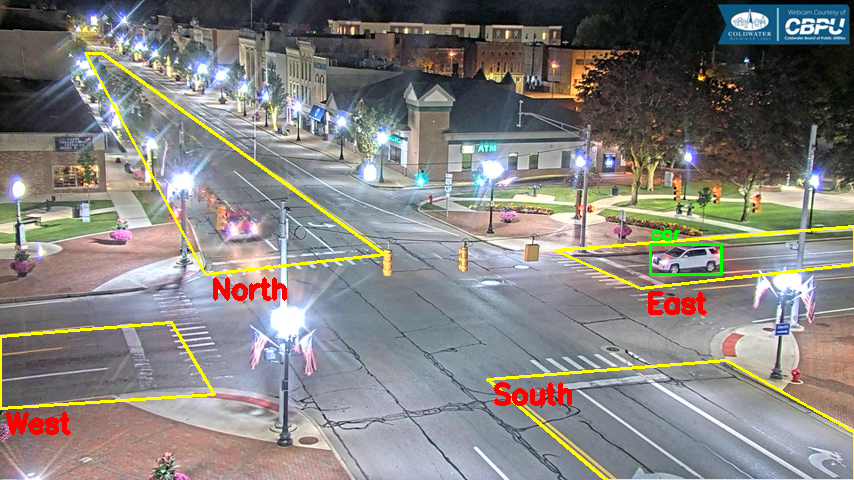

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


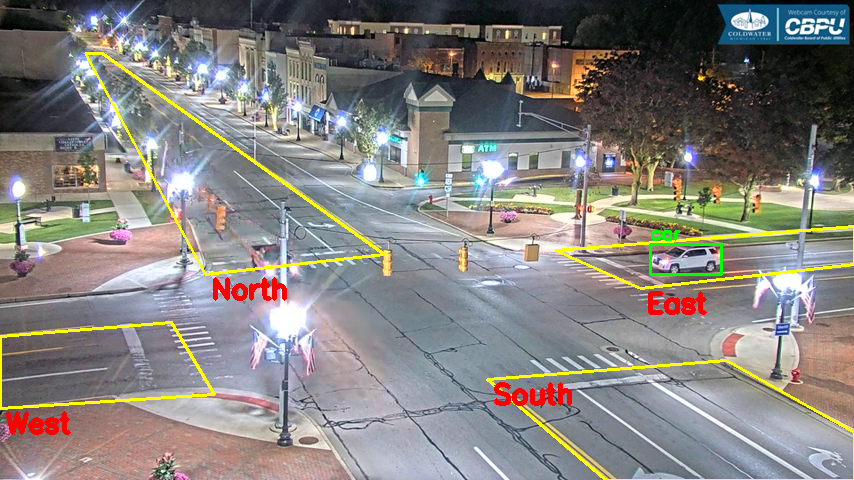

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


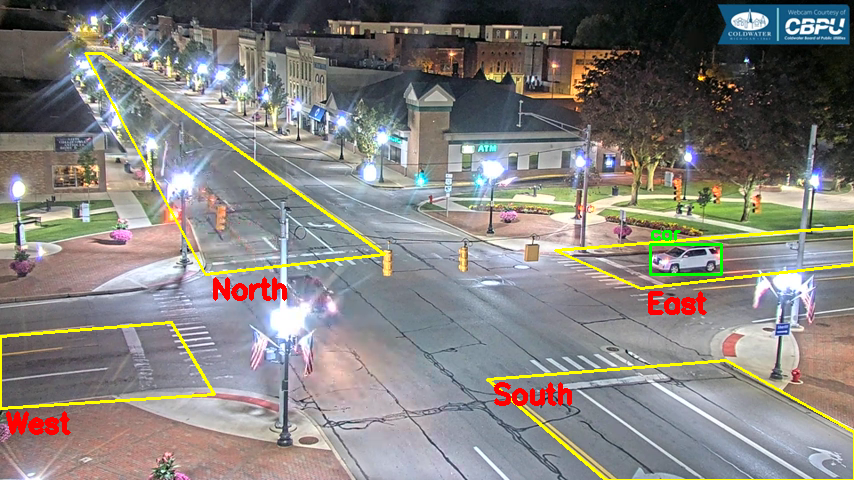

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


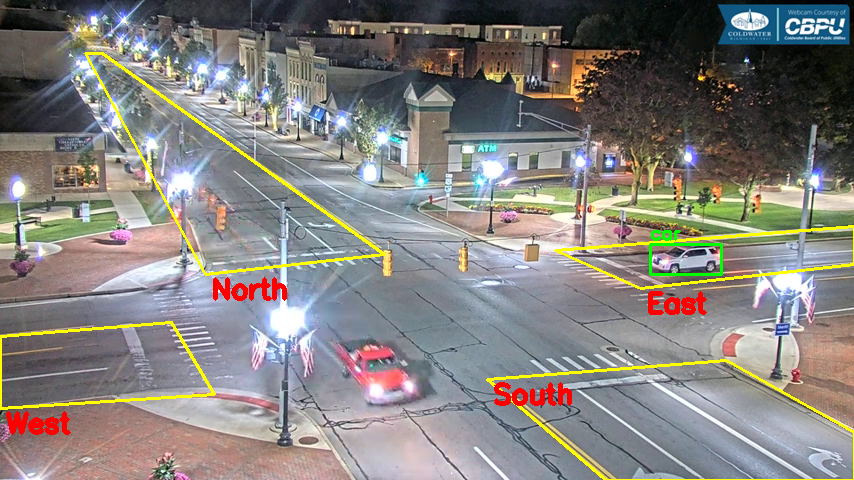

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East

Live Image:


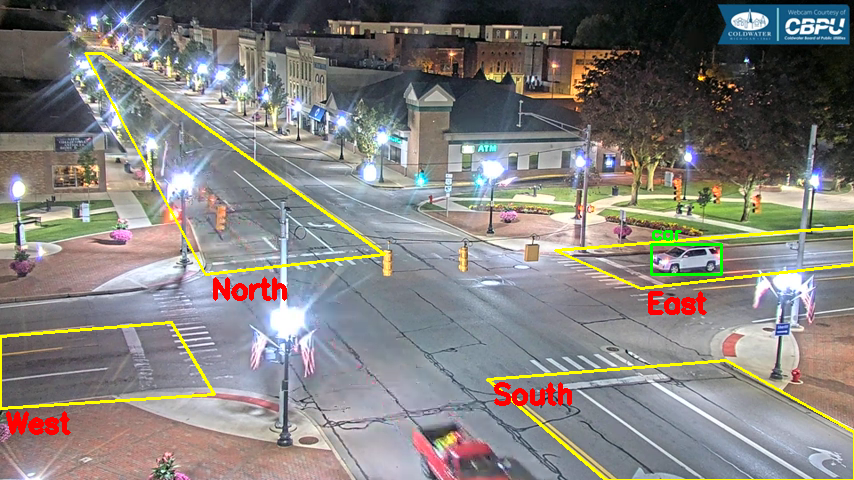

,Arah,PCU,car,motorcycle,bicycle,kendaraan_besar,Extra(s),Total Hijau(s),Prioritas?
0,West,0.0,0,0,0,0,4.0,24.0,TIDAK
1,North,0.0,0,0,0,0,4.0,24.0,TIDAK
2,East,1.0,1,0,0,0,4.2,24.2,YA
3,South,0.0,0,0,0,0,4.0,24.0,TIDAK


>>> Priority: East



KeyboardInterrupt: 

In [28]:
main()